# 1. Introduction

## 1.1 Personal Information

Grade Challenge 7
- Nama    : I Nyoman Aditya Yudiswara
- Program : FTDS-006 BSD

## 1.2 Background Problem

Butterfly has many variant species based on their form, color, and unique pattern, that usually used to differanate with other species. Butterfly has important role in ecosystem for plant pollinators and food chain for specific ecosystem. Identify species with accurate so important to understand interaction between butterfly and their ecosystem. <br>
In context conservation, understand distribution and population species butterfly can help to make better decision related their habitat preseervation. But Identify butterfly species with manual need high skill and sometimes take too much time. <br>

## 1.3 Overview Plan Solution

To solve this problem, me as data scientist want to make visualization(EDA) to learn my dataset so i can make better plan to make model for classify species butterfly from image. The metrics i will used for my model classification is accuracy because in the background problem i don't see any neccessry to use recall or precision. The model algorithm i used is CNN because my input is image and to complex to use model algorithm that usually used input dataframe.

# 2. Import Libraries

This process is used to import all library needed in this file.

In [174]:
# Libraries for data processing
import pandas as pd
import numpy as np
import numpy as np
import random

# Library for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library for  split data train , test, and evaluation
from sklearn.model_selection import train_test_split

# Lbirary for image processing
import cv2


# Library for process model neural network
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Library for metric model evaluation
from sklearn.metrics import accuracy_score

# Library to upload file json
import json

# 3. Data Loading

This process is used to load my dataset from [kaggle](https://www.kaggle.com/datasets/phucthaiv02/butterfly-image-classification/data) and explore a little bit from my data.

In [173]:
# This is command line that used for download dataset using kaggle
!kaggle datasets download -d phucthaiv02/butterfly-image-classification

Dataset URL: https://www.kaggle.com/datasets/phucthaiv02/butterfly-image-classification
License(s): CC0-1.0
100%|████████████████████████████████████████| 226M/226M [06:33<00:00, 1.51MB/s]
100%|█████████████████████████████████████████| 226M/226M [06:33<00:00, 602kB/s]


In [3]:
# This is command line that used for unzip folder from result download kaggle
!unzip -q butterfly-image-classification.zip

In [4]:
# Load file csv for df_train that used for model training and evaluation 
df_train = pd.read_csv('Training_set.csv')

# Load file csv for df_test that used for model inferential only because it only contain filename without label
df_test = pd.read_csv('Testing_set.csv')

In [5]:
# show 5 top data from df_train
df_train.head()

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART


In [6]:
# show 5 bottom data from df_train
df_train.tail()

,filename,label
6494,Image_6495.jpg,MANGROVE SKIPPER
6495,Image_6496.jpg,MOURNING CLOAK
6496,Image_6497.jpg,APPOLLO
6497,Image_6498.jpg,ELBOWED PIERROT
6498,Image_6499.jpg,ATALA


In [7]:
# show 5 top data from df_test
df_test.head()

,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg


In [8]:
# show 5 bottom data from df_test
df_test.tail()

,filename
2781,Image_2782.jpg
2782,Image_2783.jpg
2783,Image_2784.jpg
2784,Image_2785.jpg
2785,Image_2786.jpg


In [9]:
# Show df_train shape
df_train.shape

(6499, 2)

In [10]:
# Show df_test shape
df_test.shape

(2786, 1)

In [11]:
# Show column detail information from df_train
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6499 entries, 0 to 6498
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  6499 non-null   object
 1   label     6499 non-null   object
dtypes: object(2)
memory usage: 101.7+ KB


In [12]:
# Show column detail information from df_test
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2786 entries, 0 to 2785
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2786 non-null   object
dtypes: object(1)
memory usage: 21.9+ KB


From exploration above we can know that we can't use Testing_set.csv for model training or evaluation because it doesn't contain label. This file can only be used for model inferential. And also in column "filename" in Training_set.csv and Testing_set.csv dont apply folder path to folder train, so we need to modify data in column "filename".

In [13]:
# This cell is used for add folder path to folder train
def add_folder_path_to_filename(filename):
  return f'train/{filename}'

df_train['filename'] = df_train['filename'].apply(add_folder_path_to_filename)
df_train['filename']

0          train/Image_1.jpg
1          train/Image_2.jpg
2          train/Image_3.jpg
3          train/Image_4.jpg
4          train/Image_5.jpg
                ...         
6494    train/Image_6495.jpg
6495    train/Image_6496.jpg
6496    train/Image_6497.jpg
6497    train/Image_6498.jpg
6498    train/Image_6499.jpg
Name: filename, Length: 6499, dtype: object

In [14]:
# This cell is used for add folder path to folder test
def add_folder_path_to_filename(filename):
  return f'test/{filename}'

df_test['filename'] = df_test['filename'].apply(add_folder_path_to_filename)
df_test['filename']

0          test/Image_1.jpg
1          test/Image_2.jpg
2          test/Image_3.jpg
3          test/Image_4.jpg
4          test/Image_5.jpg
               ...         
2781    test/Image_2782.jpg
2782    test/Image_2783.jpg
2783    test/Image_2784.jpg
2784    test/Image_2785.jpg
2785    test/Image_2786.jpg
Name: filename, Length: 2786, dtype: object

# 4. Exploratory Data Analysis (EDA)

In [15]:
# This cell is used to save point before doing eda
df_eda = pd.DataFrame(df_train)

## 4.1 Identify Class Inbalance

In [16]:
# get total unique value in label
df_eda['label'].nunique()

75

In [17]:
# get min and max total uniq value after grouping by label
df_eda.groupby('label').size().agg([min,max])

/var/folders/cr/8g19f6x13sn907v0ff4vkmm80000gn/T/ipykernel_81397/2300166826.py:2: FutureWarning: The provided callable <built-in function min> is currently using Series.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_eda.groupby('label').size().agg([min,max])
/var/folders/cr/8g19f6x13sn907v0ff4vkmm80000gn/T/ipykernel_81397/2300166826.py:2: FutureWarning: The provided callable <built-in function max> is currently using Series.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df_eda.groupby('label').size().agg([min,max])


min     71
max    131
dtype: int64

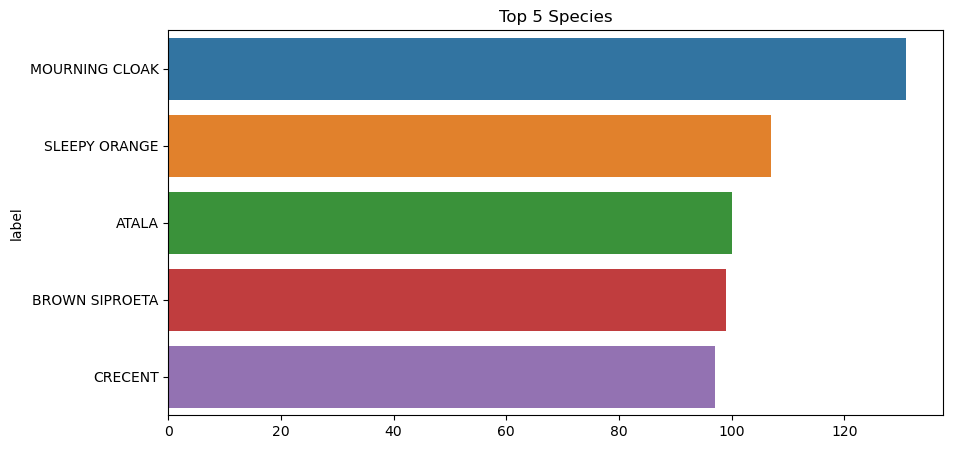

In [169]:
# get top 5 data label based on it's total row data
data = df_eda['label'].value_counts().sort_values(ascending=False).iloc[0:5]
labels = data.index
values = data.values

# seaborn bar horizontal
plt.figure(figsize=(10,5))
sns.barplot(x=values,y=labels,orient='h')
plt.title("Top 5 Species")
plt.savefig("eda1.jpg")
plt.show()


From here we know that label in folder image train has 75 label/class. And from graph "Top 5 Species" we can know that my dataset image is not balance because has different size for each class. I must do data balancing before model training

## 4.2 Visualize Image Size

In [19]:
# Add new column 'size' to get height and width for every fileName
def getWidth(filename):
  image = cv2.imread(filename)
  return image.shape[0]

def getHeight(filename):
  image = cv2.imread(filename)
  return image.shape[1]

def getSize(filename):
  image = cv2.imread(filename)
  return image.shape

df_eda['width'] = df_eda['filename'].apply(getWidth)
df_eda['height'] = df_eda['filename'].apply(getHeight)
df_eda['size'] = df_eda['filename'].apply(getSize)

In [20]:
# get unique value in label size
df_eda['size'].unique()

array([(224, 224, 3)], dtype=object)

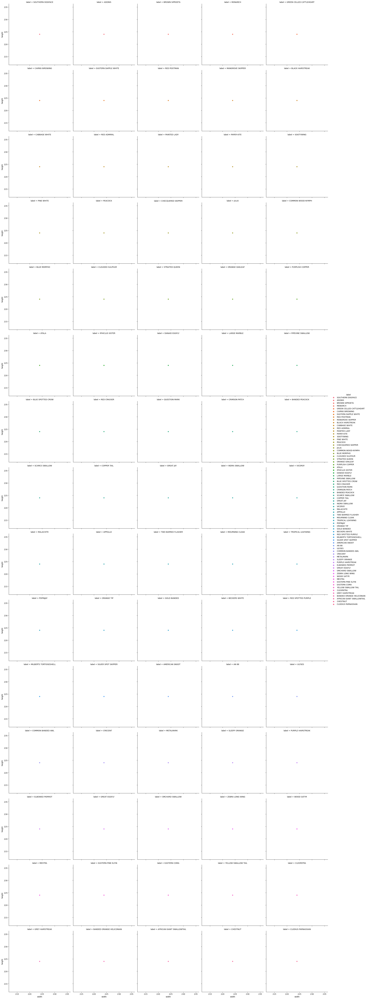

In [168]:
# Show sample label scatter plot for width and height image
data = df_eda['label'].value_counts().sort_values(ascending=False)
data_sample = df_eda[df_eda['label'].isin(data.index)]
sns.relplot(kind='scatter',x='width', y='height', data=data_sample,hue="label",col='label',col_wrap=5)

plt.show()

From analyze above we can know that my dataset image has same size (224 x 224). It's already good for model training for classify image.

## 4.3 Visualize Sampling of Images

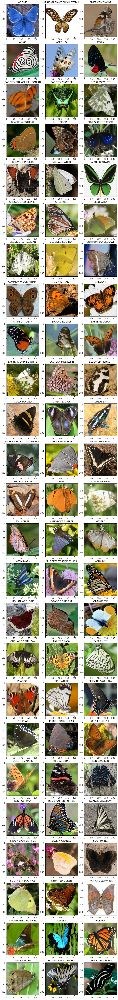

In [149]:
# This cell code is used to display one sample image for every class/species butterfly on my training dataset
fig, ax = plt.subplots(ncols=3,nrows=25,figsize=(10,90)) # Reduced figure size

data = df_eda.groupby('label')['filename'].min()
x = 0
y = 0
for i, label in enumerate(data.index.tolist()):
  filename = data.loc[label]
  butterfly = plt.imread(filename)
  ax[x][y].imshow(butterfly) # Display the image
  ax[x][y].set_title(label)
  y += 1 # Increment y for each image
  if y == 3: # Check if we've filled a row
    y = 0
    x += 1
plt.show()


These list image above are sample for every class/label. From my first impression to clasify species butterfly it's already good because to do that color is important indergredients. And filter image on edge will not work because it depend on colors.

# 5. Feature Engineer

This process is used to preapre my dataset so it's ready for model training and evaluation. 

## 5.1 Split dataset into data train and data test from df_train

To create model, split my dataset for train and test is important to evaluate my model. So data train is used for model training and model evaluation and data test for model evaluation only. Compare metric between data train and test is neccessary to determine good fit / underfit / overfit of my model.

In [23]:
# Split data into data train and data test from df_train for modelling
X_train, X_test = train_test_split(df_train, test_size=0.2, random_state=42)
print("X_train shape = ",X_train.shape);
print("X_test shape = ",X_test.shape);

X_train shape =  (5199, 2)
X_test shape =  (1300, 2)


## 5.2 Handling Data Balance

Because i am using metric accuracy that need my dataset balance and keep good performance when model training, keep my dataset balance base on my label/class is important.

In [24]:
# Check data balance based on label on X_train
X_train.groupby('label').size().sort_values(ascending=False)

label
MOURNING CLOAK               96
SLEEPY ORANGE                85
ATALA                        83
SCARCE SWALLOW               81
MILBERTS TORTOISESHELL       80
                             ..
BLUE MORPHO                  59
ORCHARD SWALLOW              59
PIPEVINE SWALLOW             58
AFRICAN GIANT SWALLOWTAIL    56
QUESTION MARK                51
Length: 75, dtype: int64

In [25]:
# Check data balance based on label on X_test
X_test.groupby('label').size().sort_values(ascending=False)

label
MOURNING CLOAK        35
RED CRACKER           27
QUESTION MARK         26
PIPEVINE SWALLOW      26
BROWN SIPROETA        26
                      ..
ZEBRA LONG WING       10
AN 88                 10
CRIMSON PATCH          9
PAINTED LADY           9
TWO BARRED FLASHER     7
Length: 75, dtype: int64

In [26]:
# This cell is used to create new image and save it's new filename to X_train so my X_train is balanced

# load my dataset groupby label and it's size
data = X_train.groupby('label').size().sort_values(ascending=False)

# It is used to add new  filename to my X_train
list_origin_data = X_train.to_numpy().tolist()
list_new_data = []

# this variable us used for process data augmentation
list_type_image_augment = ['flip_vertical','rotate_90']
max_count = data.max()
index_augmented = 1

# looping every label/class in my X_train
for label in data.index:
  total_data = data.loc[label]
  # Check if label with the highest size is more than total_data for each label
  if max_count > total_data:
    data_label = X_train[X_train['label'] == label].reset_index()
    for i in range(max_count - total_data):
      # do random index to get random image and random how to create data augmentation
      index_random_data_label = random.randint(0, len(data_label) - 1)
      index_random_image_augment = random.randint(0, len(list_type_image_augment) - 1)

      # get filename based on random index 
      filename = data_label.loc[index_random_data_label]['filename']
      image = cv2.imread(filename)
      new_filename = f'train/Image_augmented_{index_augmented}.jpg'
      if index_random_image_augment == 0:
        # do data augmentation by modify my image with flip_vertical
        newImage = cv2.flip(image, 0)
      elif index_random_image_augment == 1:
        # do data augmentation by modify my image with rotate_90
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        angle = 90  # Rotation angle in degrees
        scale = 1.0  # Scale factor
        M = cv2.getRotationMatrix2D(center, angle, scale)
        # Perform the rotation
        newImage = cv2.warpAffine(image, M, (w, h))

      # add filename to X_train and new image to folder train 
      list_new_data.append([new_filename,label])
      cv2.imwrite(new_filename, newImage)
      index_augmented += 1

list_origin_data += list_new_data
X_train = pd.DataFrame(list_origin_data, columns=['filename','label'])


In [27]:
# This cell is used to create new image and save it's new filename to X_test so my X_test is balanced

# load my dataset groupby label and it's size
data = X_test.groupby('label').size().sort_values(ascending=False)

# It is used to add new  filename to my X_test
list_origin_data = X_test.to_numpy().tolist()
list_new_data = []

# this variable us used for process data augmentation
list_type_image_augment = ['flip_vertical','rotate_90']
max_count = data.max()
index_augmented = 1

# looping every label/class in my X_test
for label in data.index:
  total_data = data.loc[label]
  # Check if label with the highest size is more than total_data for each label
  if max_count > total_data:
    data_label = X_test[X_test['label'] == label].reset_index()
    for i in range(max_count - total_data):
      # do random index to get random image and random how to create data augmentation
      index_random_data_label = random.randint(0, len(data_label) - 1)
      index_random_image_augment = random.randint(0, len(list_type_image_augment) - 1)

      # get filename based on random index 
      filename = data_label.loc[index_random_data_label]['filename']
      image = cv2.imread(filename)
      new_filename = f'test/Image_augmented_{index_augmented}.jpg'
      if index_random_image_augment == 0:
        # do data augmentation by modify my image with flip_vertical
        newImage = cv2.flip(image, 0)
      elif index_random_image_augment == 1:
        # do data augmentation by modify my image with rotate_90
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        angle = 90  # Rotation angle in degrees
        scale = 1.0  # Scale factor
        M = cv2.getRotationMatrix2D(center, angle, scale)
        # Perform the rotation
        newImage = cv2.warpAffine(image, M, (w, h))

      # add filename to X_test and new image to folder train 
      list_new_data.append([new_filename,label])
      cv2.imwrite(new_filename, newImage)
      index_augmented += 1

list_origin_data += list_new_data
X_test = pd.DataFrame(list_origin_data, columns=['filename','label'])


In [28]:
# Check data balance based on X_train
X_train.groupby('label').size().sort_values(ascending=False)

label
ADONIS               96
PURPLISH COPPER      96
POPINJAY             96
PIPEVINE SWALLOW     96
PINE WHITE           96
                     ..
CRIMSON PATCH        96
CRECENT              96
COPPER TAIL          96
COMMON WOOD-NYMPH    96
ZEBRA LONG WING      96
Length: 75, dtype: int64

In [29]:
# Check data balance based on label on X_test
X_test.groupby('label').size().sort_values(ascending=False)

label
ADONIS               35
PURPLISH COPPER      35
POPINJAY             35
PIPEVINE SWALLOW     35
PINE WHITE           35
                     ..
CRIMSON PATCH        35
CRECENT              35
COPPER TAIL          35
COMMON WOOD-NYMPH    35
ZEBRA LONG WING      35
Length: 75, dtype: int64

Right now my X_train and X_test has already balanced

## 5.3 Create ImageDataGenerator

Because i try to make model to clasify image, ImageDataGenerator is one of tools that can be used to make process model training easier. 

In [70]:
# Create ImageDataGenerator for train, test, and evaluation
train_datagen = ImageDataGenerator(rescale=1./255.,validation_split=0.2)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen_for_test = train_datagen.flow_from_dataframe(
	X_train,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)

train_gen = train_datagen.flow_from_dataframe(
	X_train,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
  subset='training',
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)


val_gen = train_datagen.flow_from_dataframe(
	X_train,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
  subset='validation',
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)

test_gen = test_datagen.flow_from_dataframe(
	X_test,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)

Found 7200 validated image filenames belonging to 75 classes.
Found 5760 validated image filenames belonging to 75 classes.
Found 1440 validated image filenames belonging to 75 classes.
Found 2625 validated image filenames belonging to 75 classes.


In [51]:
# This used for dictionary label and it's index for inferential and evaluation model
dict_butterfly_species_label = train_gen.class_indices
dict_butterfly_species_index = {}
for label in dict_butterfly_species_label: 
    dict_butterfly_species_index[dict_butterfly_species_label[label]] = label

In [129]:
with open('dict_butterfly_index.json', 'w') as file_1:
  file_1.write(json.dumps(dict_butterfly_species_index,indent=4))

In [53]:
# print dict_butterfly_species_label
dict_butterfly_species_label

{'ADONIS': 0,
 'AFRICAN GIANT SWALLOWTAIL': 1,
 'AMERICAN SNOOT': 2,
 'AN 88': 3,
 'APPOLLO': 4,
 'ATALA': 5,
 'BANDED ORANGE HELICONIAN': 6,
 'BANDED PEACOCK': 7,
 'BECKERS WHITE': 8,
 'BLACK HAIRSTREAK': 9,
 'BLUE MORPHO': 10,
 'BLUE SPOTTED CROW': 11,
 'BROWN SIPROETA': 12,
 'CABBAGE WHITE': 13,
 'CAIRNS BIRDWING': 14,
 'CHECQUERED SKIPPER': 15,
 'CHESTNUT': 16,
 'CLEOPATRA': 17,
 'CLODIUS PARNASSIAN': 18,
 'CLOUDED SULPHUR': 19,
 'COMMON BANDED AWL': 20,
 'COMMON WOOD-NYMPH': 21,
 'COPPER TAIL': 22,
 'CRECENT': 23,
 'CRIMSON PATCH': 24,
 'DANAID EGGFLY': 25,
 'EASTERN COMA': 26,
 'EASTERN DAPPLE WHITE': 27,
 'EASTERN PINE ELFIN': 28,
 'ELBOWED PIERROT': 29,
 'GOLD BANDED': 30,
 'GREAT EGGFLY': 31,
 'GREAT JAY': 32,
 'GREEN CELLED CATTLEHEART': 33,
 'GREY HAIRSTREAK': 34,
 'INDRA SWALLOW': 35,
 'IPHICLUS SISTER': 36,
 'JULIA': 37,
 'LARGE MARBLE': 38,
 'MALACHITE': 39,
 'MANGROVE SKIPPER': 40,
 'MESTRA': 41,
 'METALMARK': 42,
 'MILBERTS TORTOISESHELL': 43,
 'MONARCH': 44,
 'MOURNING

In [52]:
# print dict_butterfly_species_index
dict_butterfly_species_index

{0: 'ADONIS',
 1: 'AFRICAN GIANT SWALLOWTAIL',
 2: 'AMERICAN SNOOT',
 3: 'AN 88',
 4: 'APPOLLO',
 5: 'ATALA',
 6: 'BANDED ORANGE HELICONIAN',
 7: 'BANDED PEACOCK',
 8: 'BECKERS WHITE',
 9: 'BLACK HAIRSTREAK',
 10: 'BLUE MORPHO',
 11: 'BLUE SPOTTED CROW',
 12: 'BROWN SIPROETA',
 13: 'CABBAGE WHITE',
 14: 'CAIRNS BIRDWING',
 15: 'CHECQUERED SKIPPER',
 16: 'CHESTNUT',
 17: 'CLEOPATRA',
 18: 'CLODIUS PARNASSIAN',
 19: 'CLOUDED SULPHUR',
 20: 'COMMON BANDED AWL',
 21: 'COMMON WOOD-NYMPH',
 22: 'COPPER TAIL',
 23: 'CRECENT',
 24: 'CRIMSON PATCH',
 25: 'DANAID EGGFLY',
 26: 'EASTERN COMA',
 27: 'EASTERN DAPPLE WHITE',
 28: 'EASTERN PINE ELFIN',
 29: 'ELBOWED PIERROT',
 30: 'GOLD BANDED',
 31: 'GREAT EGGFLY',
 32: 'GREAT JAY',
 33: 'GREEN CELLED CATTLEHEART',
 34: 'GREY HAIRSTREAK',
 35: 'INDRA SWALLOW',
 36: 'IPHICLUS SISTER',
 37: 'JULIA',
 38: 'LARGE MARBLE',
 39: 'MALACHITE',
 40: 'MANGROVE SKIPPER',
 41: 'MESTRA',
 42: 'METALMARK',
 43: 'MILBERTS TORTOISESHELL',
 44: 'MONARCH',
 45: 'MOUR

In [55]:
# THis cell is used to create new column index_label in X_train and X_test that will be used for model evaluation
def convert_label_to_index(label):
    return dict_butterfly_species_label[label]
X_train['index_label'] = X_train['label'].apply(convert_label_to_index)
X_test['index_label'] = X_test['label'].apply(convert_label_to_index)


In [56]:
# print top 5 X_train
X_train.head()

,filename,label,index_label
0,train/Image_2852.jpg,ORCHARD SWALLOW,48
1,train/Image_4919.jpg,BLACK HAIRSTREAK,9
2,train/Image_5691.jpg,QUESTION MARK,57
3,train/Image_4263.jpg,BANDED ORANGE HELICONIAN,6
4,train/Image_4976.jpg,CRIMSON PATCH,24


In [57]:
# print top 5 X_test
X_test.head()

,filename,label,index_label
0,train/Image_5573.jpg,GREEN CELLED CATTLEHEART,33
1,train/Image_1704.jpg,MONARCH,44
2,train/Image_5863.jpg,QUESTION MARK,57
3,train/Image_1774.jpg,APPOLLO,4
4,train/Image_5710.jpg,BANDED PEACOCK,7


# 6. Model Definition

Because i want to make model to clasify image, CNN Neural Network is ideal model algorithm because this task so complex. Because my image has size 224 x 224 so my input layer has 50176. For layer to CNN i create 128 neuron because rule of thumb. For hidden layer process neural network i create 5 layer because classify image is complex task and every layer has 128 neuron because follow rule of thumb. In my output layer I create 75 layer based on my total label/class.

In [32]:
# Clear Session For Neural Network 
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [33]:
# Create Model Architecure for Neural Network 
model = tf.keras.models.Sequential()

model.add(tf.keras.layers.Conv2D(128, (3,3),activation='relu', input_shape=(224, 224, 3)))
model.add(tf.keras.layers.MaxPooling2D(3, 3))
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(75, activation='softmax'))

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


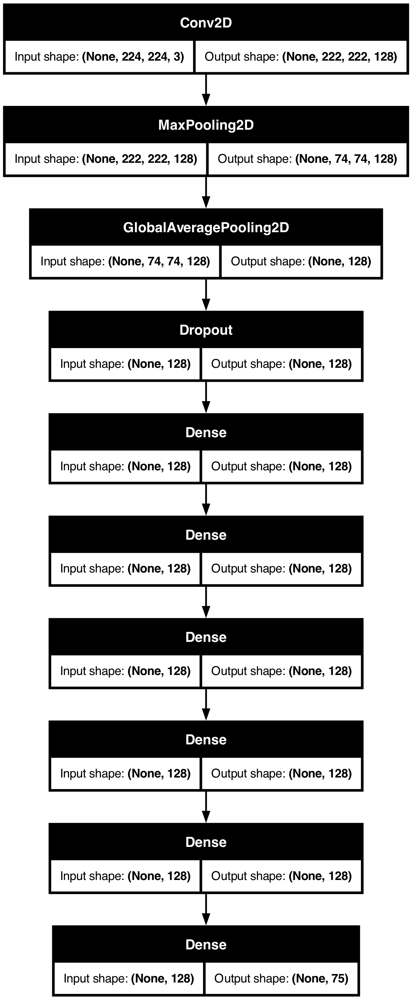

In [34]:
# Plot model Layers
tf.keras.utils.plot_model(model, show_shapes=True)

In [35]:
# See model summary like layer, parameter , etc
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 128)  │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 75)             │         9,675 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 95,819 (374.29 KB)

 Trainable params: 95,819 (374.29 KB)

 Non-trainable params: 0 (0.00 B)

# 7. Model Training And Saving Before Tuning

In [152]:
# This cell is used to model training with CNN Neural Network
model.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])
history_before = model.fit(train_gen, epochs=25, steps_per_epoch=20, validation_data = val_gen, verbose = 1, validation_steps=10)

Epoch 1/25


/opt/anaconda3/lib/python3.11/site-packages/keras/src/backend/tensorflow/trainer.py:75: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")
/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.0203 - loss: 4.2380 - val_accuracy: 0.0183 - val_loss: 4.2537
Epoch 2/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 19s 922ms/step - accuracy: 0.0501 - loss: 4.2307 - val_accuracy: 0.0222 - val_loss: 4.2534
Epoch 3/25


/opt/anaconda3/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 481ms/step - accuracy: 0.0068 - loss: 4.2560 - val_accuracy: 0.0183 - val_loss: 4.2537
Epoch 4/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 21s 995ms/step - accuracy: 0.0232 - loss: 4.2491 - val_accuracy: 0.0222 - val_loss: 4.2534
Epoch 5/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.0234 - loss: 4.2480 - val_accuracy: 0.0183 - val_loss: 4.2537
Epoch 6/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - accuracy: 0.0272 - loss: 4.2520 - val_accuracy: 0.0222 - val_loss: 4.2534
Epoch 7/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.0181 - loss: 4.2429 - val_accuracy: 0.0183 - val_loss: 4.2537
Epoch 8/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.0432 - loss: 4.2429 - val_accuracy: 0.0222 - val_loss: 4.2534
Epoch 9/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 715ms/step - accuracy: 0.0213 - loss: 4.2572 - val_accuracy: 0.0183 - val_loss: 4.2537
Epoch 10/25
20/20 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.0231 - loss: 4.2510 - val_accuracy: 0.0222 - val_loss

2024-07-16 18:08:29.432203: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


20/20 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.0358 - loss: 4.2428 - val_accuracy: 0.0183 - val_loss: 4.2537


In [39]:
# Freeze Model
model.trainable = False

In [40]:
# Saving model before tuning 
model.save("model_before.h5")

# 8. Model Definition Tuning

After Model Training before, i want to try using pre trained model to improve my model performance. And also do data augmentation when model training.

In [46]:
# Clear Session For Neural Network 
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [59]:
# Create ImageDataGenerator for train, evaluation and test. for train i added data augmentation for process model tuning
train_datagen_tuning = ImageDataGenerator(rescale=1./255.,validation_split=0.2,rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')
    
train_gen_tuning = train_datagen_tuning.flow_from_dataframe(
	X_train,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
  subset='training',
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)


val_gen_tuning = train_datagen_tuning.flow_from_dataframe(
	X_train,
  x_col='filename',
  y_col='label',
  seed=2,
	target_size=(224,224),
  subset='validation',
	class_mode='categorical',
  batch_size=126,
	shuffle=False,
)

Found 5760 validated image filenames belonging to 75 classes.
Found 1440 validated image filenames belonging to 75 classes.


In [61]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(75, activation='softmax')(x)

model_tuning = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model_tuning.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.637701 to fit



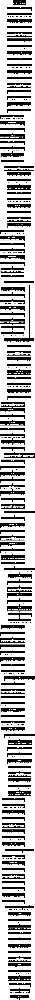

In [62]:
# Plot model Layers
tf.keras.utils.plot_model(model_tuning, show_shapes=True)

In [63]:
# Show Model Tuning Summary
model_tuning.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,952,331 (11.26 MB)

 Trainable params: 694,347 (2.65 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

# 9. Model Training And Saving After Tuning

After Make my model definition for tuning, i will use that model to training with Data train and evaluation that already added with data augmentation

In [65]:
# Training model tuning
history = model_tuning.fit(
    train_gen_tuning,
    steps_per_epoch=train_gen_tuning.n // train_gen_tuning.batch_size,
    epochs=25,
    validation_data=val_gen_tuning,
    validation_steps=val_gen_tuning.n // val_gen_tuning.batch_size
)

Epoch 1/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - accuracy: 0.1034 - loss: 4.0934

/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


45/45 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.1048 - loss: 4.0816 - val_accuracy: 0.4177 - val_loss: 2.3619
Epoch 2/25
 1/45 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.1825 - loss: 3.5180

/opt/anaconda3/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1825 - loss: 3.5180 - val_accuracy: 0.3889 - val_loss: 2.3381
Epoch 3/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.4981 - loss: 1.9632 - val_accuracy: 0.5375 - val_loss: 1.6834
Epoch 4/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2460 - loss: 3.0985 - val_accuracy: 0.5000 - val_loss: 1.7833
Epoch 5/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.6194 - loss: 1.3840 - val_accuracy: 0.6364 - val_loss: 1.2909
Epoch 6/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8333 - loss: 0.7075 - val_accuracy: 0.6481 - val_loss: 1.0946
Epoch 7/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.7296 - loss: 0.9685 - val_accuracy: 0.7532 - val_loss: 0.9629
Epoch 8/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8254 - loss: 0.6740 - val_accuracy: 0.7407 - val_loss: 0.9718
Epoch 9/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.7630 - loss: 0.8564 - val_accuracy: 0.7518 - val_loss: 0.8648


2024-07-16 08:56:40.943744: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


45/45 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.8390 - loss: 0.6057 - val_accuracy: 0.8139 - val_loss: 0.7115
Epoch 14/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8016 - loss: 0.5797 - val_accuracy: 0.8148 - val_loss: 0.5822
Epoch 15/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.8457 - loss: 0.5342 - val_accuracy: 0.7597 - val_loss: 0.8051
Epoch 16/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8095 - loss: 0.7006 - val_accuracy: 0.7222 - val_loss: 0.7157
Epoch 17/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.8367 - loss: 0.5471 - val_accuracy: 0.7908 - val_loss: 0.7326
Epoch 18/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.8492 - loss: 0.4750 - val_accuracy: 0.8333 - val_loss: 0.5339
Epoch 19/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.8560 - loss: 0.4893 - val_accuracy: 0.8232 - val_loss: 0.6480
Epoch 20/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9603 - loss: 0.2353 - val_accuracy: 0.8148 - val_loss: 0.5

In [67]:
# Freeze model tuning
model_tuning.trainable = False

In [68]:
# Saving model tuning to file model_after.h5
model_tuning.save('model_after.h5')

# 10. Model Evaluation Before and After Tuning

After do model definition and training ( before and after tuning), I want to know my model loss and accuracy for every epoch in graph. Also i want to evaluate my model with metrics accuracy with data train anda data test. And then i choose the best model between before and after tuning

Loss and Accuracy Model before Tuning


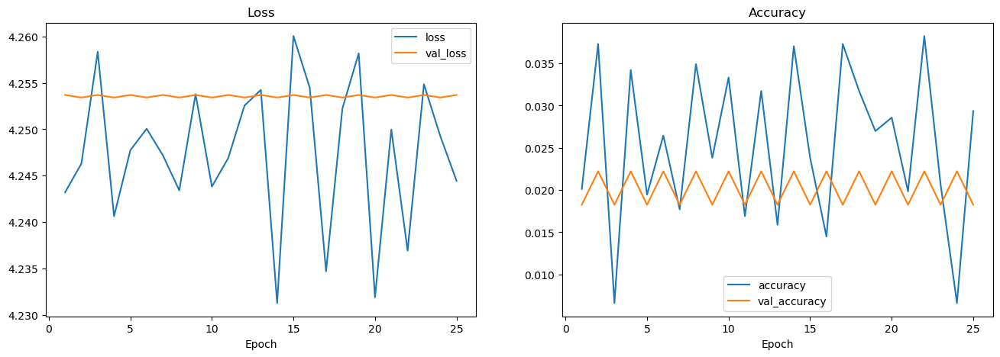

In [155]:
# Create visualization model loss and accuracy after tuning
epoch=25

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history_before.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history_before.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')


ax[1].plot(range(1,epoch+1),history_before.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history_before.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')

print("Loss and Accuracy Model before Tuning")
plt.show()

Loss and Accuracy Model after Tuning


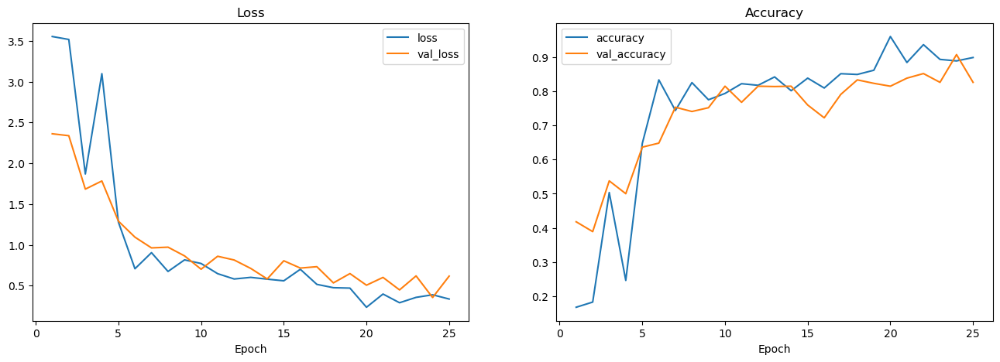

In [156]:
# Create visualization model loss and accuracy after tuning
epoch=25

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')


ax[1].plot(range(1,epoch+1),history.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')

print("Loss and Accuracy Model after Tuning")
plt.show()

From Graph loss and accuracy we can see the different performance between model before tuning and model after tuning. In model before tuning we can see that the pattern loss and accuracy is not usual and not normal to show good progress in neural network. Different with model after tuning, pattern loss has down smoothly and accuracy patter increase smoothly. And model before tuning has really bad performance with only get the highest accuracy 2% but model after tuning get score accuracy 90 % in train.

In [71]:
# Predict using model before tuning
pred_train_before_tuning = model.predict(train_gen_for_test)
pred_test_before_tuning = model.predict(test_gen)

# Predict using model after tuning
pred_train_after_tuning = model_tuning.predict(train_gen_for_test)
pred_test_after_tuning = model_tuning.predict(test_gen)

/opt/anaconda3/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


58/58 ━━━━━━━━━━━━━━━━━━━━ 47s 788ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 14s 646ms/step
58/58 ━━━━━━━━━━━━━━━━━━━━ 45s 756ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 16s 748ms/step


In [75]:
# find the final predict by finding the highest score from 75 class for every data 
pred_train_before_tuning_final = []
pred_test_before_tuning_final = []

pred_train_after_tuning_final = []
pred_test_after_tuning_final = []
for classes in pred_train_before_tuning: 
    pred_train_before_tuning_final.append(np.argmax(classes))

for classes in pred_test_before_tuning: 
    pred_test_before_tuning_final.append(np.argmax(classes))

for classes in pred_train_after_tuning: 
    pred_train_after_tuning_final.append(np.argmax(classes))

for classes in pred_test_after_tuning: 
    pred_test_after_tuning_final.append(np.argmax(classes))

In [88]:
# Add new column about result prediction by using model before tuning and model after tuning
X_train['pred_before_tuning'] = pred_train_before_tuning_final
X_train['pred_after_tuning'] = pred_train_after_tuning_final

In [161]:
# Show 5 data who has the good prediction using model before tuning in data train
X_train[X_train['index_label'] != X_train['pred_before_tuning']].groupby('label').size().sort_values().iloc[0:5]

label
CLOUDED SULPHUR               4
ULYSES                       20
AFRICAN GIANT SWALLOWTAIL    86
QUESTION MARK                92
PIPEVINE SWALLOW             96
dtype: int64

In [162]:
# Show 5 data who has the good prediction using model before tuning in data train
X_test[X_test['index_label'] != X_test['pred_before_tuning']].groupby('label').size().sort_values().iloc[0:5]

label
CLOUDED SULPHUR               1
ULYSES                        8
AFRICAN GIANT SWALLOWTAIL    23
POPINJAY                     35
PIPEVINE SWALLOW             35
dtype: int64

From data above i can know that model before tuning can only good to predict class CLOUDED SULPHUR and ULYSES in data train and data test . but the rest my model before tuning has a hard time to clasify image species butterfly

In [92]:
X_test['pred_before_tuning'] = pred_test_before_tuning_final
X_test['pred_after_tuning'] = pred_test_after_tuning_final

In [165]:
# Show 5 data who has the gobadod prediction using model after tuning in data train
X_train[X_train['index_label'] != X_train['pred_after_tuning']].groupby('label').size().sort_values(ascending=False).iloc[0:5]

label
COMMON WOOD-NYMPH       75
CLOUDED SULPHUR         30
EASTERN DAPPLE WHITE    29
COPPER TAIL             24
SOOTYWING               23
dtype: int64

In [107]:
# Show 5 data who has the good prediction using model before tuning in data test
X_test[X_test['index_label'] != X_test['pred_after_tuning']].groupby('label').size().sort_values(ascending=False).iloc[0:5]

label
COMMON WOOD-NYMPH       75
CLOUDED SULPHUR         30
EASTERN DAPPLE WHITE    29
COPPER TAIL             24
SOOTYWING               23
dtype: int64

From data above i can know that my model after tuning still has hard time to clasify species COMMON WOOD-NYMPH in data train and data test. but the rest i think it is not perfect but already good because it can clasify correct species more than 70 %.

In [81]:
print("Accuracy Score Model before tuning for data train = ",accuracy_score(X_train['index_label'],pred_train_before_tuning_final))
print("Accuracy Score Model before tuning for data test = ",accuracy_score(X_test['index_label'],pred_test_before_tuning_final))

Accuracy Score Model before tuning for data train =  0.025277777777777777
Accuracy Score Model before tuning for data test =  0.02780952380952381


In [79]:
print("Accuracy Score Model after tuning for data train = ",accuracy_score(X_train['index_label'],pred_train_after_tuning_final))
print("Accuracy Score Model after tuning for data test = ",accuracy_score(X_test['index_label'],pred_test_after_tuning_final))

Accuracy Score Model after tuning for data train =  0.9148611111111111
Accuracy Score Model after tuning for data test =  0.8083809523809524


By comparing accuracy between model before tuning and model after tuning we can see that model before tuning is good fit but has really bad perforamnce with accuracy only 2%. different with model after tuning that actually overfit, but has good score with accuracy test 80%.

# 11. Conclusion

## 11.1 Conclusion EDA

After do EDA, i can know my starter dataset has inbalance label distribution. It will impact with model training and also because i am using accuracy as my metrics, model balancing is mandatory. And all my images for model training has same size 224x224 which is good to save time for pre processing. And because my model goal is to clasify species butterfly that depends on color, process gray scaling and edge is not neccessary.

## 11.2 Conclusion Model 

After do Model Definition, Training, Tuning, and Evaluation I decide that my model after tuning is the best model that i will used in my model inference and deployment. The reason is my model tuning has good accuracy score. There are several weakness in my model tuning:
- my model is overfit. 
- my model have hard time to clasify image for species COMMON WOOD-NYMPH.

My model strong point is it can clasify beside that species with accuracy more than 80 %. Which is good to know species to solve conservation.

## 11.3 Plan Future Model Improvement

In the future there are many plan i want to try to increase my model to clasify species butterfly : 
- Increase variant species butterfly data image, because right now i have 75 mlticlass but reality butterfly species has 17,500 variant. 
- Do more epoch, so i expect the loss will be more decrased and accuracy increasing. 
- Try different architecture nerual network to get variant performance